In [1]:
from __future__ import division

from models import *
from utils.logger import *
from utils.utils import *
from utils.datasets import * 
from utils.parse_config import *
from test import evaluate

from terminaltables import AsciiTable

from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.ticker import NullLocator

import os
import sys
import time
import datetime
from glob import glob
import csv

import torch
from torch.utils.data import DataLoader
from torchvision import datasets
from torchvision import transforms
from torch.autograd import Variable
import torch.optim as optim
import torch.nn.functional as F

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
Tensor = torch.cuda.FloatTensor if torch.cuda.is_available() else torch.FloatTensor

os.makedirs("output", exist_ok=True)
os.makedirs("checkpoints", exist_ok=True)

# Hyperparameter

In [3]:
params = {
    "epochs":200, #number of epochs
    "batch_size":8, #size of each image batch
    "log_interval":400, #interval train loss
    "cut_num":1600, #cut number of batch size
    "gradient_accumulations":2, #number of gradient accums before step
    "model_def":"config/yolov3.cfg", #path to model definition file
    "data_config":"config/custom.data", #path to data config file
    "pretrained_weights":"weights/darknet53.conv.74", #if specified starts from checkpoint model
    "n_cpu":0, #number of cpu threads to use during batch generation
    "img_size":512, #size of each image dimension
    "checkpoint_interval":1, #interval between saving model weights
    "multiscale_training":True, #allow for multi-scale training
    "class_path":"data/custom/classes.names",
    "conf_thres":0.8,
    "nms_thres":0.4
}

# Model

In [4]:
model = Darknet(params["model_def"]).to(device)
model.apply(weights_init_normal)

optimizer = torch.optim.Adam(model.parameters())

In [5]:
if params["pretrained_weights"]:
    if params["pretrained_weights"].endswith(".pth"):
        model.load_state_dict(torch.load(params["pretrained_weights"]))
    else:
        model.load_darknet_weights(params["pretrained_weights"])

# Preprocess

In [6]:
data_config = parse_data_config(params["data_config"])
train_path = data_config["train"]
valid_path = data_config["valid"]
class_names = load_classes(data_config["names"])

In [7]:
train_dataset = ListDataset(train_path, augment=True, multiscale=params["multiscale_training"])
train_dataloader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=params["batch_size"],
    shuffle=True,
    num_workers=params["n_cpu"],
    pin_memory=True,
    collate_fn=train_dataset.collate_fn,
)

val_dataset = ListDataset(valid_path, augment=True, multiscale=params["multiscale_training"])
val_dataloader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=params["batch_size"],
    shuffle=False,
    num_workers=params["n_cpu"],
    pin_memory=True,
    collate_fn=val_dataset.collate_fn,
)

# Visualization

In [8]:
def visualization(model, img_path):
    model.eval()
    classes = load_classes(params["class_path"])

    image = transforms.ToTensor()(Image.open(img_path).convert("RGB"))
    image = F.interpolate(image.unsqueeze(0), size=params["img_size"], mode="nearest").squeeze(0)
    
    with torch.no_grad():
        detections = model(image.unsqueeze(0).to(device))
        detections = non_max_suppression(detections, params["conf_thres"], params["nms_thres"])

    # Bounding-box colors
    cmap = plt.get_cmap("tab20b")
    colors = [cmap(i) for i in np.linspace(0, 1, 20)]

    img = np.array(Image.open(img_path))
    plt.figure()
    fig, ax = plt.subplots(1)
    ax.imshow(img)
    ax.set_title("Predicted BoundingBox Image")
    ax.axis('off')
    
    if detections[0] is not None:
        detections = rescale_boxes(detections[0], params["img_size"], img.shape[:2])
        unique_labels = detections[:, -1].cpu().unique()
        n_cls_preds = len(unique_labels)
        bbox_colors = random.sample(colors, n_cls_preds)
    
        for x1, y1, x2, y2, conf, cls_conf, cls_pred in detections:
            box_w = x2 - x1
            box_h = y2 - y1
            color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
                       
            # Create a Rectangle patch
            bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor="none")

            # Add the bbox to the plot
            ax.add_patch(bbox)
            # Add label
            plt.text(
                x1,
                y1,
                s=classes[0],
                color="white",
                verticalalignment="top", 
                bbox={"color": color, "pad": 0},
            )

<Figure size 432x288 with 0 Axes>

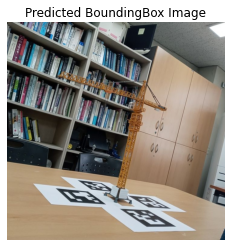

In [9]:
img_path = "C:/Users/IVCL/Desktop/crane/real_image/creal_0001.png"
visualization(model, img_path)

# Train

In [10]:
train_avg_losses = []
val_avg_losses = []

for epoch in range(1, params["epochs"]+1):
    model.train()
    train_losses = []
    val_losses = [] 
    start_time = time.time()
    for batch_i, (_, imgs, targets) in enumerate(train_dataloader): 
        
        batches_done = len(train_dataloader) * epoch + batch_i

        imgs = Variable(imgs.to(device))
        targets = Variable(targets.to(device), requires_grad=False)

        loss, outputs = model(imgs, targets)
        loss.backward()

        if batches_done % params["gradient_accumulations"]:
            # Accumulates gradient before each step
            optimizer.step()
            optimizer.zero_grad()
        
        train_losses.append(loss.item())
        
        if batch_i % params["log_interval"] == 0:
            print("===> Epoch[{}/{}]({}/{}): Loss: {:.4f}".format(
                epoch, params["epochs"], batch_i, params["cut_num"], loss.item()))
        
        if batch_i == params["cut_num"]:
            break

    train_avg_loss = torch.mean(torch.FloatTensor(train_losses))
    train_avg_losses.append(train_avg_loss.item())
    
    model.eval()
    with torch.no_grad():
        for batch_i, (_, imgs, targets) in enumerate(val_dataloader):   
            imgs = Variable(imgs.to(device))
            targets = Variable(targets.to(device), requires_grad=False)
            loss, outputs = model(imgs, targets)
            
            val_losses.append(loss.item())

    val_avg_loss = torch.mean(torch.FloatTensor(val_losses))
    val_avg_losses.append(val_avg_loss.item())
    
    print("Val_Loss: {:.4f}".format(val_avg_loss.item()))
        
    if epoch % params["checkpoint_interval"] == 0:
        torch.save(model.state_dict(), f"checkpoints/DR2/yolov3_ckpt_%d.pth" % epoch)

===> Epoch[1/200](0/1600): Loss: 239.0917
===> Epoch[1/200](400/1600): Loss: 10.3465
===> Epoch[1/200](800/1600): Loss: 9.0736
===> Epoch[1/200](1200/1600): Loss: 8.6043
===> Epoch[1/200](1600/1600): Loss: 9.7819
Val_Loss: 8.9041
===> Epoch[2/200](0/1600): Loss: 10.2343
===> Epoch[2/200](400/1600): Loss: 8.9082
===> Epoch[2/200](800/1600): Loss: 5.1182
===> Epoch[2/200](1200/1600): Loss: 6.8360
===> Epoch[2/200](1600/1600): Loss: 7.2136
Val_Loss: 5.7353
===> Epoch[3/200](0/1600): Loss: 4.4898
===> Epoch[3/200](400/1600): Loss: 3.1080
===> Epoch[3/200](800/1600): Loss: 5.1798
===> Epoch[3/200](1200/1600): Loss: 4.2875
===> Epoch[3/200](1600/1600): Loss: 3.0634
Val_Loss: 3.0466
===> Epoch[4/200](0/1600): Loss: 2.7354
===> Epoch[4/200](400/1600): Loss: 3.4963
===> Epoch[4/200](800/1600): Loss: 4.3198
===> Epoch[4/200](1200/1600): Loss: 3.3948
===> Epoch[4/200](1600/1600): Loss: 2.4200
Val_Loss: 4.1762
===> Epoch[5/200](0/1600): Loss: 5.0092
===> Epoch[5/200](400/1600): Loss: 4.2025
===> E

===> Epoch[36/200](1200/1600): Loss: 1.0964
===> Epoch[36/200](1600/1600): Loss: 0.9149
Val_Loss: 1.8172
===> Epoch[37/200](0/1600): Loss: 1.6442
===> Epoch[37/200](400/1600): Loss: 1.2325
===> Epoch[37/200](800/1600): Loss: 1.2064
===> Epoch[37/200](1200/1600): Loss: 1.2310
===> Epoch[37/200](1600/1600): Loss: 0.8095
Val_Loss: 2.0686
===> Epoch[38/200](0/1600): Loss: 0.6073
===> Epoch[38/200](400/1600): Loss: 1.0843
===> Epoch[38/200](800/1600): Loss: 1.1167
===> Epoch[38/200](1200/1600): Loss: 0.7542
===> Epoch[38/200](1600/1600): Loss: 1.7681
Val_Loss: 2.1175
===> Epoch[39/200](0/1600): Loss: 0.7037
===> Epoch[39/200](400/1600): Loss: 1.2194
===> Epoch[39/200](800/1600): Loss: 0.8853
===> Epoch[39/200](1200/1600): Loss: 0.6242
===> Epoch[39/200](1600/1600): Loss: 1.6027
Val_Loss: 2.0516
===> Epoch[40/200](0/1600): Loss: 0.8424
===> Epoch[40/200](400/1600): Loss: 0.8307
===> Epoch[40/200](800/1600): Loss: 1.7053
===> Epoch[40/200](1200/1600): Loss: 1.6233
===> Epoch[40/200](1600/1600

Val_Loss: 1.5206
===> Epoch[72/200](0/1600): Loss: 0.4229
===> Epoch[72/200](400/1600): Loss: 0.6512
===> Epoch[72/200](800/1600): Loss: 0.8582
===> Epoch[72/200](1200/1600): Loss: 2.2501
===> Epoch[72/200](1600/1600): Loss: 0.5991
Val_Loss: 2.0255
===> Epoch[73/200](0/1600): Loss: 1.1929
===> Epoch[73/200](400/1600): Loss: 0.5678
===> Epoch[73/200](800/1600): Loss: 0.7819
===> Epoch[73/200](1200/1600): Loss: 0.3710
===> Epoch[73/200](1600/1600): Loss: 0.9247
Val_Loss: 2.3496
===> Epoch[74/200](0/1600): Loss: 0.6115
===> Epoch[74/200](400/1600): Loss: 0.7221
===> Epoch[74/200](800/1600): Loss: 0.5260
===> Epoch[74/200](1200/1600): Loss: 0.8963
===> Epoch[74/200](1600/1600): Loss: 0.4625
Val_Loss: 3.5200
===> Epoch[75/200](0/1600): Loss: 1.0977
===> Epoch[75/200](400/1600): Loss: 0.5442
===> Epoch[75/200](800/1600): Loss: 0.8117
===> Epoch[75/200](1200/1600): Loss: 0.3851
===> Epoch[75/200](1600/1600): Loss: 0.4013
Val_Loss: 1.8928
===> Epoch[76/200](0/1600): Loss: 0.8403
===> Epoch[76/

===> Epoch[107/200](400/1600): Loss: 0.7068
===> Epoch[107/200](800/1600): Loss: 0.4923
===> Epoch[107/200](1200/1600): Loss: 0.5385
===> Epoch[107/200](1600/1600): Loss: 0.7311
Val_Loss: 1.3469
===> Epoch[108/200](0/1600): Loss: 0.7164
===> Epoch[108/200](400/1600): Loss: 0.6612
===> Epoch[108/200](800/1600): Loss: 0.6300
===> Epoch[108/200](1200/1600): Loss: 0.9948
===> Epoch[108/200](1600/1600): Loss: 0.3558
Val_Loss: 2.3858
===> Epoch[109/200](0/1600): Loss: 0.8967
===> Epoch[109/200](400/1600): Loss: 0.5372
===> Epoch[109/200](800/1600): Loss: 0.3447
===> Epoch[109/200](1200/1600): Loss: 0.7245
===> Epoch[109/200](1600/1600): Loss: 0.5973
Val_Loss: 1.8431
===> Epoch[110/200](0/1600): Loss: 0.6144
===> Epoch[110/200](400/1600): Loss: 0.4540
===> Epoch[110/200](800/1600): Loss: 0.2633
===> Epoch[110/200](1200/1600): Loss: 0.3783
===> Epoch[110/200](1600/1600): Loss: 0.6249
Val_Loss: 2.9045
===> Epoch[111/200](0/1600): Loss: 0.5162
===> Epoch[111/200](400/1600): Loss: 0.4439
===> Epo

Val_Loss: 1.9589
===> Epoch[142/200](0/1600): Loss: 0.1720
===> Epoch[142/200](400/1600): Loss: 0.5527
===> Epoch[142/200](800/1600): Loss: 0.7142
===> Epoch[142/200](1200/1600): Loss: 0.7345
===> Epoch[142/200](1600/1600): Loss: 0.4576
Val_Loss: 2.7667
===> Epoch[143/200](0/1600): Loss: 0.4387
===> Epoch[143/200](400/1600): Loss: 0.1954
===> Epoch[143/200](800/1600): Loss: 0.4925
===> Epoch[143/200](1200/1600): Loss: 0.5091
===> Epoch[143/200](1600/1600): Loss: 0.3072
Val_Loss: 2.4856
===> Epoch[144/200](0/1600): Loss: 0.5268
===> Epoch[144/200](400/1600): Loss: 1.3898
===> Epoch[144/200](800/1600): Loss: 0.3353
===> Epoch[144/200](1200/1600): Loss: 0.6981
===> Epoch[144/200](1600/1600): Loss: 0.7100
Val_Loss: 2.0800
===> Epoch[145/200](0/1600): Loss: 0.3587
===> Epoch[145/200](400/1600): Loss: 0.4926
===> Epoch[145/200](800/1600): Loss: 0.5625
===> Epoch[145/200](1200/1600): Loss: 0.2795
===> Epoch[145/200](1600/1600): Loss: 0.4345
Val_Loss: 2.4102
===> Epoch[146/200](0/1600): Loss: 

===> Epoch[176/200](1200/1600): Loss: 0.1527
===> Epoch[176/200](1600/1600): Loss: 0.2205
Val_Loss: 2.0366
===> Epoch[177/200](0/1600): Loss: 0.9168
===> Epoch[177/200](400/1600): Loss: 0.4921
===> Epoch[177/200](800/1600): Loss: 0.2622
===> Epoch[177/200](1200/1600): Loss: 0.4171
===> Epoch[177/200](1600/1600): Loss: 0.4355
Val_Loss: 3.0656
===> Epoch[178/200](0/1600): Loss: 0.2097
===> Epoch[178/200](400/1600): Loss: 0.4805
===> Epoch[178/200](800/1600): Loss: 0.2667
===> Epoch[178/200](1200/1600): Loss: 0.3172
===> Epoch[178/200](1600/1600): Loss: 0.3814
Val_Loss: 3.0228
===> Epoch[179/200](0/1600): Loss: 0.5099
===> Epoch[179/200](400/1600): Loss: 0.2450
===> Epoch[179/200](800/1600): Loss: 0.5900
===> Epoch[179/200](1200/1600): Loss: 0.3417
===> Epoch[179/200](1600/1600): Loss: 0.8260
Val_Loss: 3.1862
===> Epoch[180/200](0/1600): Loss: 0.4497
===> Epoch[180/200](400/1600): Loss: 0.5280
===> Epoch[180/200](800/1600): Loss: 0.2076
===> Epoch[180/200](1200/1600): Loss: 0.5763
===> Ep

In [11]:
print('Minimum validation loss :', val_avg_losses[np.array(val_avg_losses).argmin()], np.array(val_avg_losses).argmin()+1, "epoch")

Minimum validation loss : 1.3197579383850098 81 epoch


# Loss Curve

In [12]:
csvfile=open('../loss/train_loss_yolov3_dr2.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(train_avg_losses).reshape(len(train_avg_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

csvfile=open('../loss/val_loss_yolov3_dr2.csv','w', newline="")
csvwriter = csv.writer(csvfile)

for row in np.array(val_avg_losses).reshape(len(val_avg_losses),1):
    csvwriter.writerow(row)
    
csvfile.close()

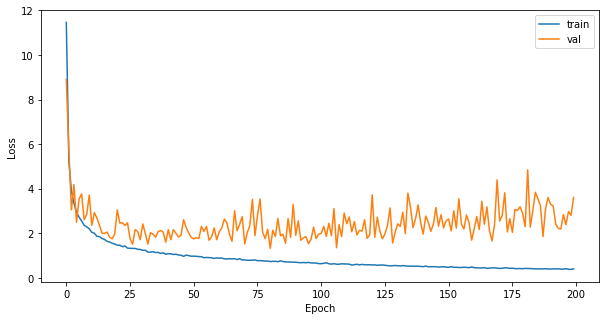

In [13]:
plt.figure(figsize=(10,5))
plt.plot(train_avg_losses, label='train')
plt.plot(val_avg_losses, label='val')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Restore Checkpoint 

In [35]:
model.load_state_dict(torch.load(f"checkpoints/DR2/yolov3_ckpt_27.pth"))

<All keys matched successfully>

# Test

In [36]:
model.eval()
precision, recall, AP, f1, ap_class = evaluate(
                model,
                path=valid_path,
                iou_thres=0.5,
                conf_thres=0.5,
                nms_thres=0.5,
                img_size=params["img_size"],
                batch_size=params["batch_size"],
            )

Computing AP: 100%|██████████████████████████████████████████████████████████████████████████████| 1/1 [00:00<?, ?it/s]


In [37]:
print("test_precision :",precision[0], "\ttest_recall :",recall[0], "\ttest AP :", AP[0], "\ttest_f1 :", f1[0], "\ntest_ap_class :", ap_class[0])

test_precision : 0.9710144927536232 	test_recall : 1.0 	test AP : 1.0 	test_f1 : 0.9852941176470589 
test_ap_class : 0


<Figure size 432x288 with 0 Axes>

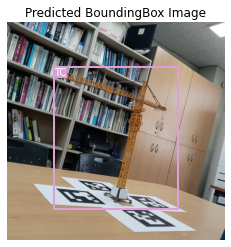

In [38]:
img_path = "C:/Users/IVCL/Desktop/crane/real_image/creal_0001.png"
visualization(model, img_path)

<ipython-input-8-f3e1c8e9180a>:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()
<ipython-input-8-f3e1c8e9180a>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1)


<Figure size 432x288 with 0 Axes>

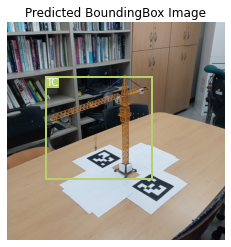

<Figure size 432x288 with 0 Axes>

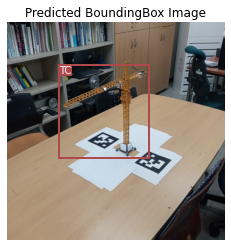

<Figure size 432x288 with 0 Axes>

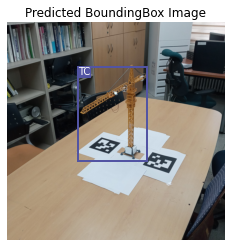

<Figure size 432x288 with 0 Axes>

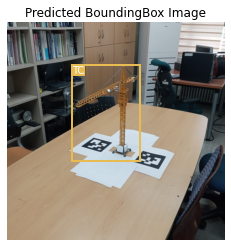

<Figure size 432x288 with 0 Axes>

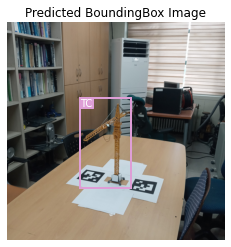

<Figure size 432x288 with 0 Axes>

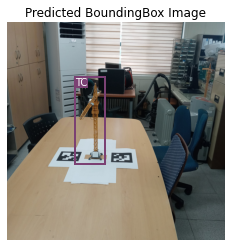

<Figure size 432x288 with 0 Axes>

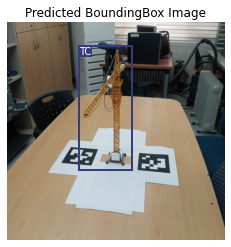

<Figure size 432x288 with 0 Axes>

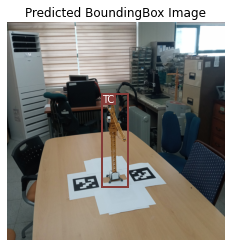

<Figure size 432x288 with 0 Axes>

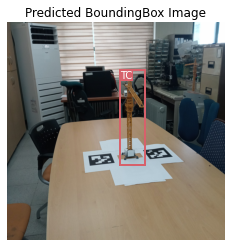

<Figure size 432x288 with 0 Axes>

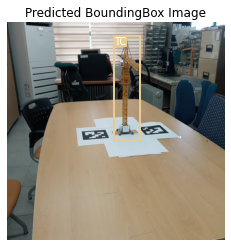

<Figure size 432x288 with 0 Axes>

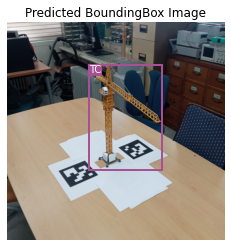

<Figure size 432x288 with 0 Axes>

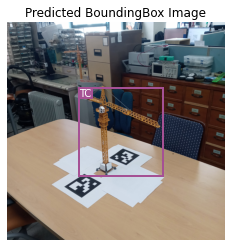

<Figure size 432x288 with 0 Axes>

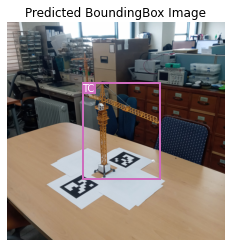

<Figure size 432x288 with 0 Axes>

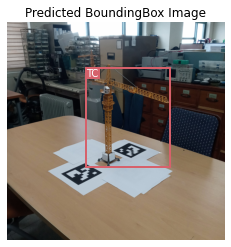

<Figure size 432x288 with 0 Axes>

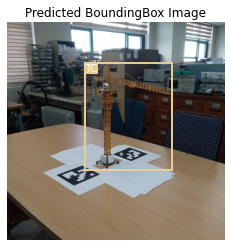

<Figure size 432x288 with 0 Axes>

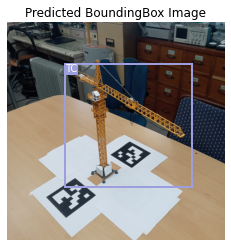

<Figure size 432x288 with 0 Axes>

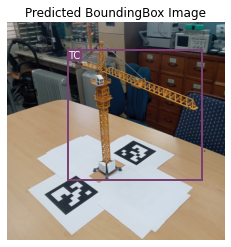

<Figure size 432x288 with 0 Axes>

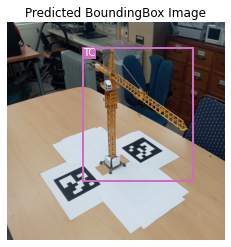

<Figure size 432x288 with 0 Axes>

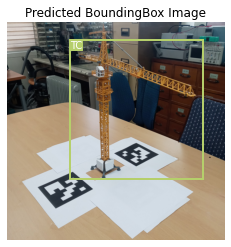

<Figure size 432x288 with 0 Axes>

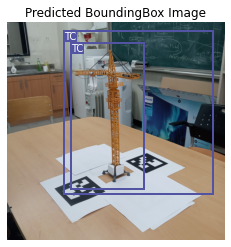

<Figure size 432x288 with 0 Axes>

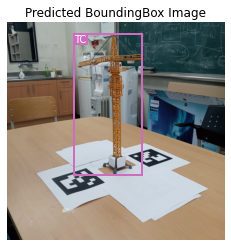

<Figure size 432x288 with 0 Axes>

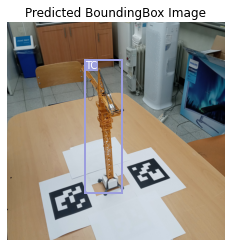

<Figure size 432x288 with 0 Axes>

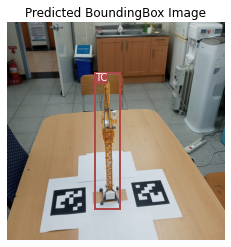

<Figure size 432x288 with 0 Axes>

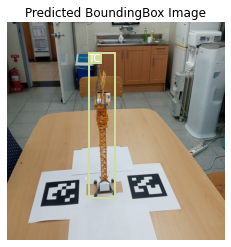

<Figure size 432x288 with 0 Axes>

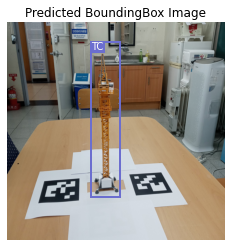

<Figure size 432x288 with 0 Axes>

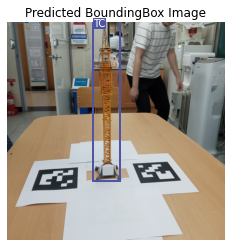

<Figure size 432x288 with 0 Axes>

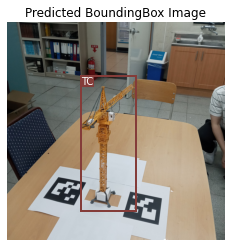

<Figure size 432x288 with 0 Axes>

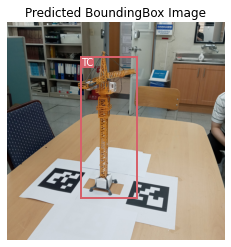

<Figure size 432x288 with 0 Axes>

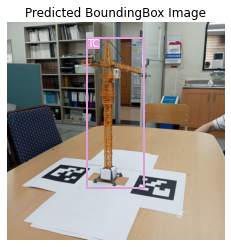

<Figure size 432x288 with 0 Axes>

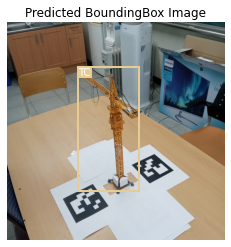

<Figure size 432x288 with 0 Axes>

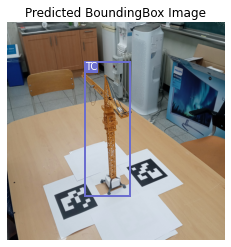

<Figure size 432x288 with 0 Axes>

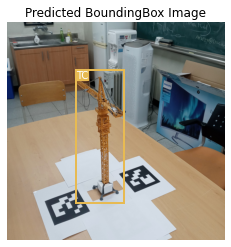

<Figure size 432x288 with 0 Axes>

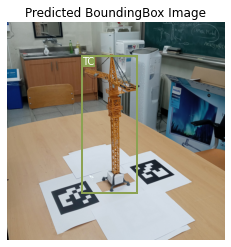

<Figure size 432x288 with 0 Axes>

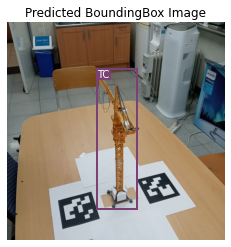

<Figure size 432x288 with 0 Axes>

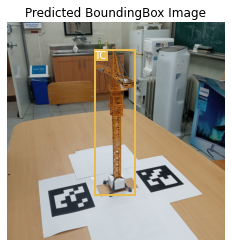

<Figure size 432x288 with 0 Axes>

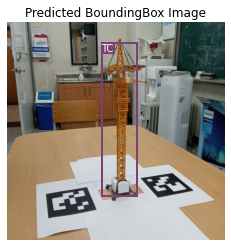

<Figure size 432x288 with 0 Axes>

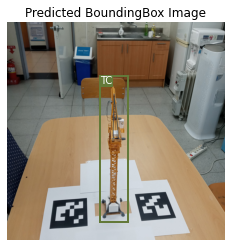

<Figure size 432x288 with 0 Axes>

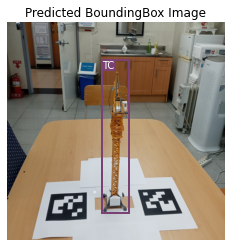

<Figure size 432x288 with 0 Axes>

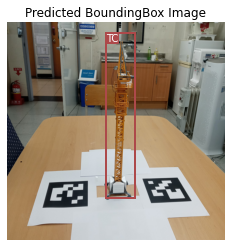

<Figure size 432x288 with 0 Axes>

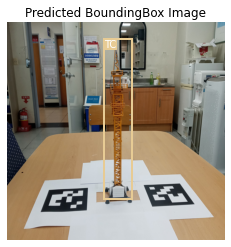

<Figure size 432x288 with 0 Axes>

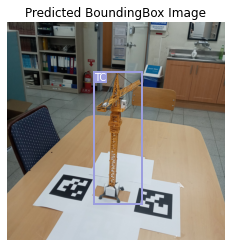

<Figure size 432x288 with 0 Axes>

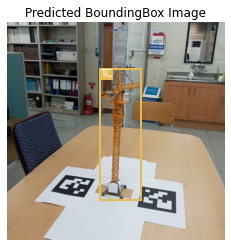

<Figure size 432x288 with 0 Axes>

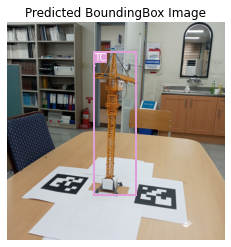

<Figure size 432x288 with 0 Axes>

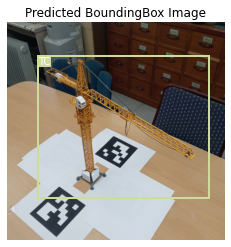

<Figure size 432x288 with 0 Axes>

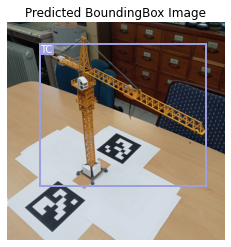

<Figure size 432x288 with 0 Axes>

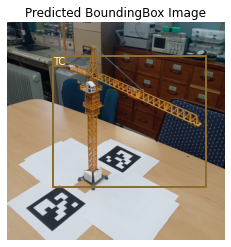

<Figure size 432x288 with 0 Axes>

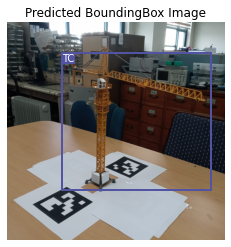

<Figure size 432x288 with 0 Axes>

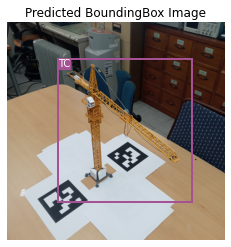

<Figure size 432x288 with 0 Axes>

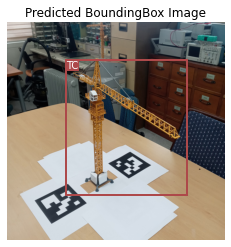

<Figure size 432x288 with 0 Axes>

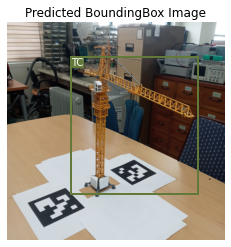

<Figure size 432x288 with 0 Axes>

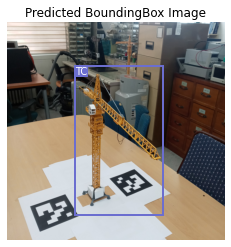

<Figure size 432x288 with 0 Axes>

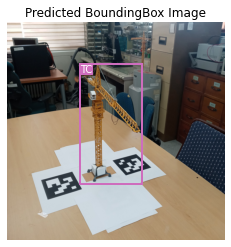

<Figure size 432x288 with 0 Axes>

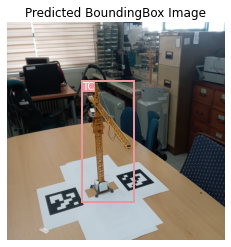

<Figure size 432x288 with 0 Axes>

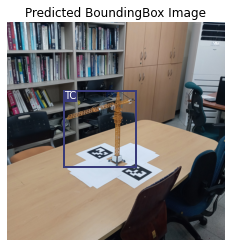

<Figure size 432x288 with 0 Axes>

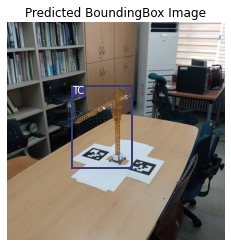

<Figure size 432x288 with 0 Axes>

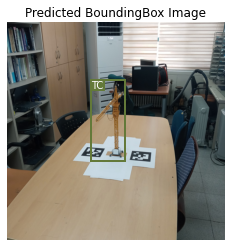

<Figure size 432x288 with 0 Axes>

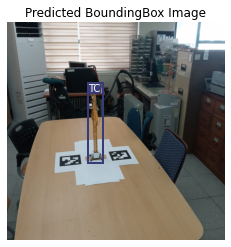

<Figure size 432x288 with 0 Axes>

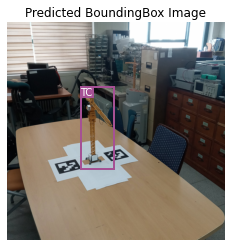

<Figure size 432x288 with 0 Axes>

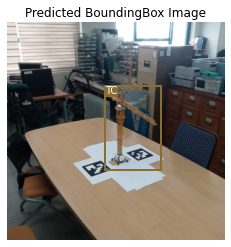

<Figure size 432x288 with 0 Axes>

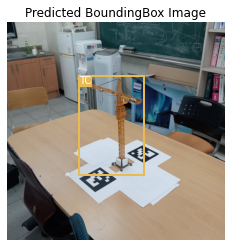

<Figure size 432x288 with 0 Axes>

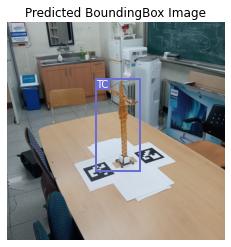

<Figure size 432x288 with 0 Axes>

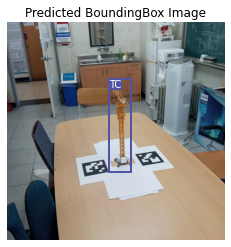

<Figure size 432x288 with 0 Axes>

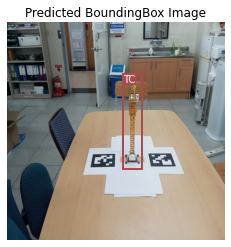

<Figure size 432x288 with 0 Axes>

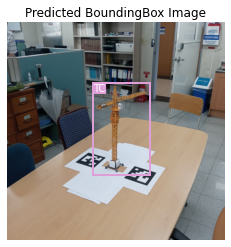

<Figure size 432x288 with 0 Axes>

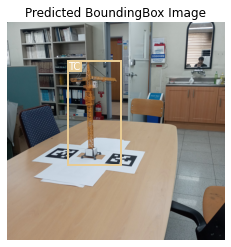

<Figure size 432x288 with 0 Axes>

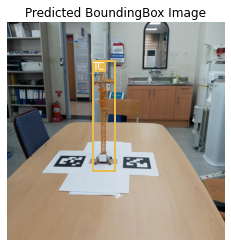

<Figure size 432x288 with 0 Axes>

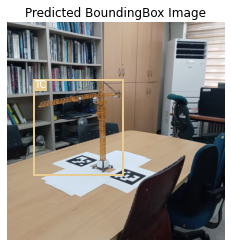

<Figure size 432x288 with 0 Axes>

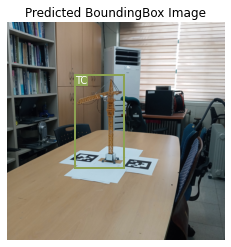

<Figure size 432x288 with 0 Axes>

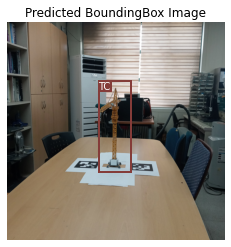

<Figure size 432x288 with 0 Axes>

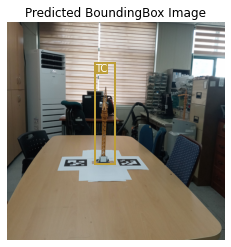

<Figure size 432x288 with 0 Axes>

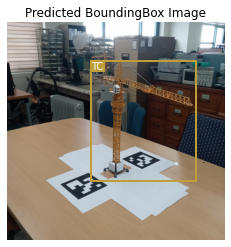

<Figure size 432x288 with 0 Axes>

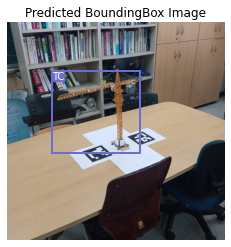

<Figure size 432x288 with 0 Axes>

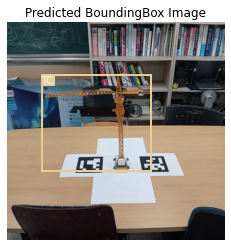

<Figure size 432x288 with 0 Axes>

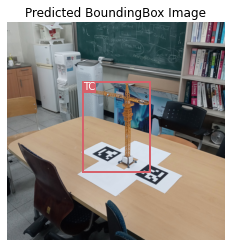

<Figure size 432x288 with 0 Axes>

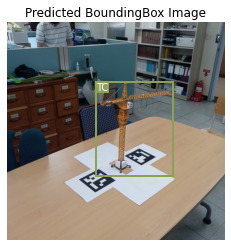

<Figure size 432x288 with 0 Axes>

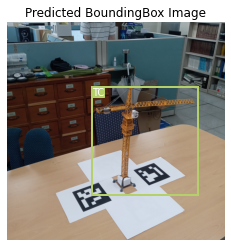

<Figure size 432x288 with 0 Axes>

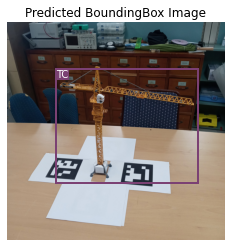

<Figure size 432x288 with 0 Axes>

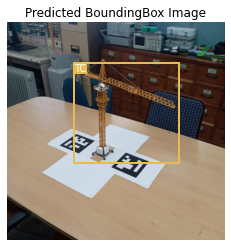

<Figure size 432x288 with 0 Axes>

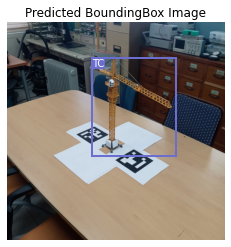

<Figure size 432x288 with 0 Axes>

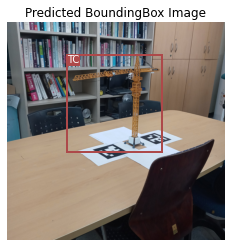

<Figure size 432x288 with 0 Axes>

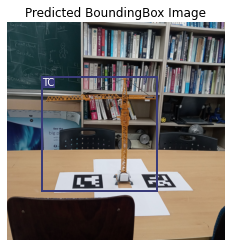

<Figure size 432x288 with 0 Axes>

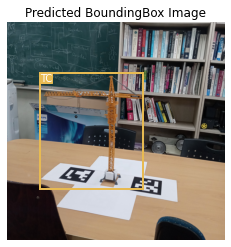

<Figure size 432x288 with 0 Axes>

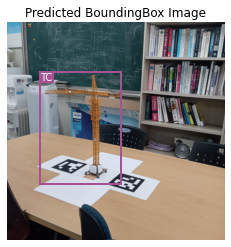

<Figure size 432x288 with 0 Axes>

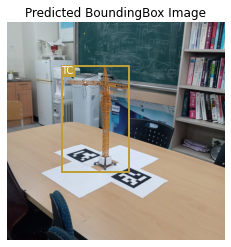

<Figure size 432x288 with 0 Axes>

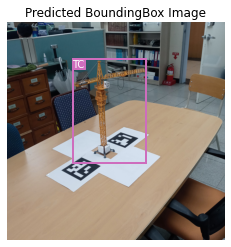

<Figure size 432x288 with 0 Axes>

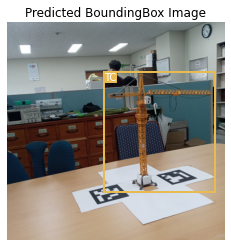

<Figure size 432x288 with 0 Axes>

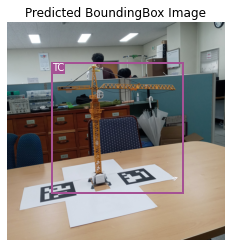

<Figure size 432x288 with 0 Axes>

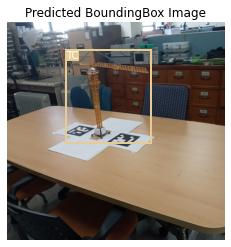

<Figure size 432x288 with 0 Axes>

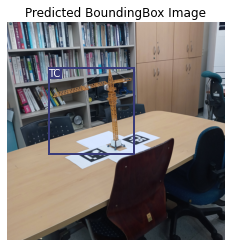

<Figure size 432x288 with 0 Axes>

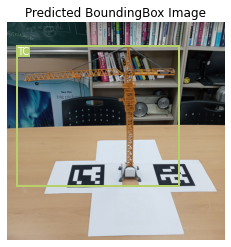

<Figure size 432x288 with 0 Axes>

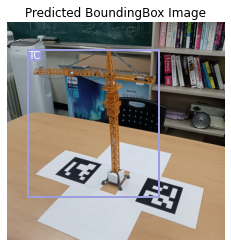

<Figure size 432x288 with 0 Axes>

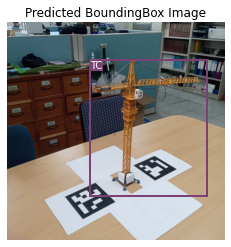

<Figure size 432x288 with 0 Axes>

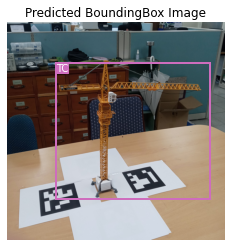

<Figure size 432x288 with 0 Axes>

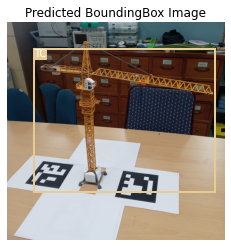

<Figure size 432x288 with 0 Axes>

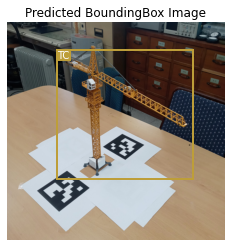

<Figure size 432x288 with 0 Axes>

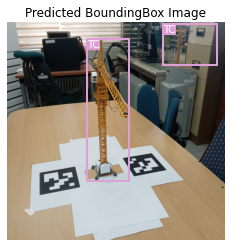

<Figure size 432x288 with 0 Axes>

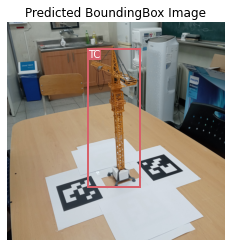

<Figure size 432x288 with 0 Axes>

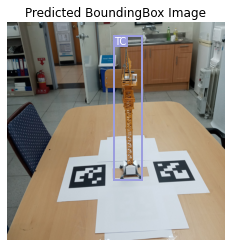

<Figure size 432x288 with 0 Axes>

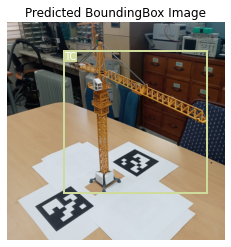

<Figure size 432x288 with 0 Axes>

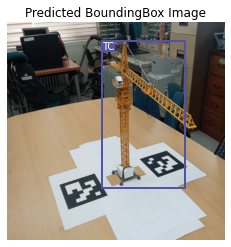

In [39]:
model.eval()
images = glob("C:/Users/IVCL/Desktop/crane/real2_image/*.png")
for image in images:
    visualization(model, image)